In [1]:
import numpy as np
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
import orc

jax.config.update("jax_enable_x64", True)


def KS_1D_PBC(
    u0, tN, dt=0.1, domain=(0, 100), Nx=200, rtol=1e-12, atol=1e-12, max_steps=1e4
):
    """
    Solve 1D Kuramoto Sivashinsky Equation with Periodic Boundary Conditions. Uses exponential time-differencing + RK4 (ETDRK4) scheme to solve the PDE and deal with stiff terms.
    Author: Dima Tretiak

    MODEL:
        u_t + u*u_x + u_xx + nu*u_xxxx = 0

    INPUTS:
        u0: initial condition of shape (N,)
        tN: final time
        dt: time step (only used to interpolate solution after solve, integration time step is adaptive)
        domain: tuple of (x0, xN) where x0 and xN are the left and right boundaries of the domain
        max_steps: maximum number of time steps to take. Default is 1e4

    OUTPUTS:
        t: time series vector of shape K where K is the number of time steps taken
        U: solution of shape (K, N)

    Sample Usage:
        domain = (0, 32*np.pi)
        Nx = 256
        x0 = np.linspace(domain[0], domain[1], Nx, endpoint=True) #Note: important to ensure PBC of IC. (however, the spectral solver throws away this point)
        u0 = np.sin((16/domain[1])*np.pi * x0)
        TN = 1000
        dt = 0.1
        U,t = KS_1D_PBC(u0, TN, dt, domain, Nx)
        imshow_1D_spatiotemp(U, TN, domain, vmax = 3.5, vmin = -3.5)
    """
    # Define the spatial grid
    Nx = Nx - 1  # PBC - only solving for Nx-1 points
    u0 = u0[:-1]  # PBC: throw away duplicate point
    x = np.linspace(domain[0], domain[1], int(Nx), endpoint=False)
    dx = x[1] - x[0]

    # initialize solutions
    U = np.zeros((Nx, int(tN / dt)))
    U[:, 0] = u0

    # Define the wavenumbers
    k = np.fft.fftfreq(int(Nx), d=dx) * 2 * np.pi
    k2 = k**2
    k4 = k**4
    L_op = k2 - k4  # Linear operator
    N_op_u = lambda u: 1j * k * np.fft.fft(-0.5 * u**2)  # Nonlinear operator acts on u
    N_op_uhat = (
        lambda u: 1j * k * np.fft.fft(-0.5 * np.real(np.fft.ifft(u)) ** 2)
    )  # Nonlinear operator acts on u_hat

    # compute exp coeffs using complex means from Kassam et al, 2005
    E1 = np.exp(L_op * dt)
    E2 = np.exp(L_op * dt / 2)
    M = 16
    r = np.exp(1j * np.pi * (np.arange(1, M + 1) - 0.5) / M)
    LR = dt * np.column_stack([L_op] * M) + np.row_stack([r] * (Nx))
    Q = dt * np.mean((np.exp(LR / 2) - 1) / LR, axis=1)
    f1 = dt * np.mean((-4 - LR + np.exp(LR) * (4 - 3 * LR + LR**2)) / LR**3, axis=1)
    f2 = dt * np.mean((2 + LR + np.exp(LR) * (-2 + LR)) / LR**3, axis=1)
    f3 = dt * np.mean((-4 - 3 * LR - LR**2 + np.exp(LR) * (4 - LR)) / LR**3, axis=1)

    # time stepping loop
    for i in range(int(tN / dt) - 1):
        u = U[:, i]
        u_hat = np.fft.fft(u)
        a = E2 * u_hat + Q * N_op_u(u)
        b = E2 * u_hat + Q * N_op_uhat(a)
        c = E2 * a + Q * (2 * N_op_uhat(b) - N_op_u(u))
        u_hat = (
            E1 * u_hat
            + f1 * N_op_u(u)
            + f2 * (N_op_uhat(a) + N_op_uhat(b))
            + f3 * N_op_uhat(c)
        )

        U[:, i + 1] = np.real((np.fft.ifft(u_hat, n=Nx)))

    # Fill in PBC
    U = np.vstack((U, U[0, :]))
    t = np.arange(0, tN, dt)

    return U, t


# visualization function
def imshow_1D_spatiotemp(U, TN, domain, figsize=(20, 6), title=None, **kwargs):
    """
    Plot 1D spatiotemporal data using imshow.
    Author: Dima Tretiak

    INPUTS:
        U: 2D array of shape (Nx, NT) where Nx is the number of spatial points and NT is the number of time points
        TN: final time
        domain: tuple of length 2 containing the bounds of the spatial domain
        title: string containing the title of the plot, if None no title is shown
        **kwargs: additional arguments to pass to imshow
    """

    # set defaults for imshow
    kwargs.setdefault("aspect", "auto")
    kwargs.setdefault("origin", "lower")
    kwargs.setdefault("cmap", "RdGy")
    kwargs.setdefault("extent", [0, TN, domain[0], domain[1]])

    plt.figure(figsize=figsize, dpi=300)
    plt.imshow(U, **kwargs)
    plt.ylabel("x")
    plt.xlabel("t")
    if title is not None:
        plt.title(title)
    plt.colorbar(pad=0.01, label=r"$u$")
    plt.show()

/tmp/ipykernel_1945299/2164903191.py:60: DeprecationWarning: `row_stack` alias is deprecated. Use `np.vstack` directly.
  LR = dt * np.column_stack([L_op]*M) + np.row_stack([r]*(Nx))


U shape: (256, 30000)
t shape: (30000,)


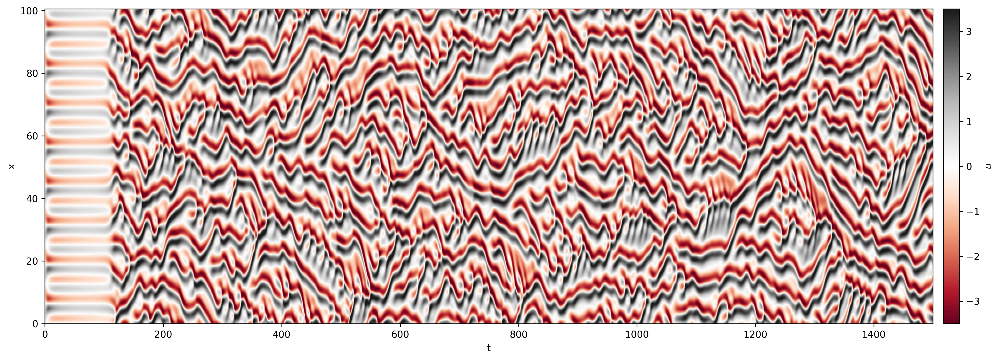

In [2]:
# Generate some data!

domain = (0, 32 * np.pi)  # x in [0, 32*pi]
Nx = 256  # number of spatial points
x0 = np.linspace(
    domain[0], domain[1], Nx, endpoint=True
)  # Ensure periodic boundary condition of IC
u0 = np.sin((16 / domain[1]) * np.pi * x0)  # initial condition
TN = 1500  # time step
dt = 0.05
U, t = KS_1D_PBC(u0, TN, dt, domain, Nx)  # Solve!

# train-test split
test_perc = 0.2
split_idx = int((1 - test_perc) * U.shape[1])
U_train = U[:, :split_idx].T
t_train = t[:split_idx].T
U_test = U[:, split_idx:].T
t_test = t[split_idx:].T
print(
    "U shape:", U.shape
)  # Lorentz would be 3 x 10000, this just has many more state variables
print("t shape:", t.shape)
imshow_1D_spatiotemp(U, TN, domain, vmax=3.5, vmin=-3.5)

In [3]:
input_sequence = jnp.array(U_train[:-1])
target_sequence = jnp.array(U_train[1:])
NR = 500
groups = 32
locality = 3
esn = orc.models.ESN(data_dim=Nx, res_dim=NR, seed=2, groups=groups, locality=locality)


esn, output_seq = orc.rc.train_RC_forecaster(
    esn,
    input_sequence,
    target_sequence,
    spinup=200,
    initial_res_state=jax.numpy.zeros((groups, NR), dtype=jnp.float64),
    beta=8e-8,
)

fcast = esn.forecast(U_test.shape[0], output_seq[-1])

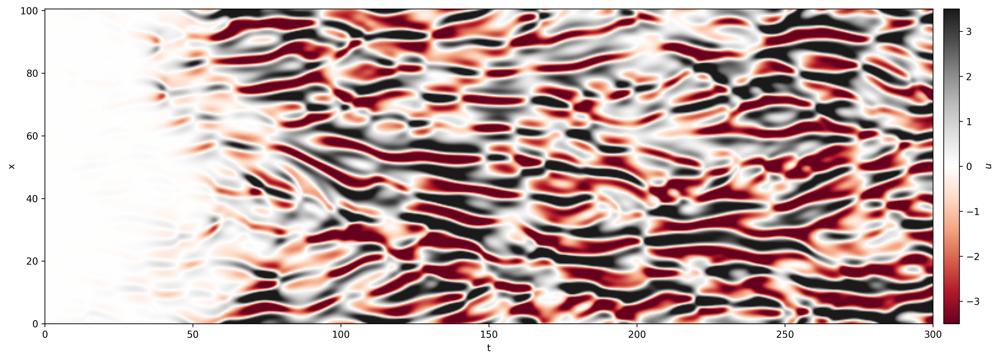

In [4]:
imshow_1D_spatiotemp(fcast.T - U_test.T, test_perc * TN, domain, vmax=3.5, vmin=-3.5)